# Predicting Titanic Survivors

The sinking of the **RMS Titanic** is one of the most infamous shipwrecks in history. On April 15, 1912, during her maiden voyage, the Titanic sank after colliding with an iceberg, killing 1502 out of 2224 passengers and crew, that's around 68% of all tripulation. This tragedy shocked the international community and led to better safety regulations for ships.

<img src="./titanic_01.jpg" alt="RMS Titanic" width="400"/>

One of the reasons of so many victims was the lack of enough lifeboats for passengers and crew. From the part of the tripulation that survived, there were multiple factors contributing and luck was one of them, but some groups of people were more likely to survive than others such as women children and the upper-class.

In this challenge we want an analysis of what people were more likely to survive. In particular we wnat to apply the tools of machine learning to predict which passengers survived the tragedy.

In [1]:
# Load standard libraries
%matplotlib inline
%load_ext watermark
%watermark -v -m -p numpy,pandas,sklearn -g

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import watermark
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

CPython 3.7.3
IPython 7.8.0

numpy 1.16.4
pandas 0.25.0
sklearn 0.21.2

compiler   : Clang 4.0.1 (tags/RELEASE_401/final)
system     : Darwin
release    : 18.7.0
machine    : x86_64
processor  : i386
CPU cores  : 16
interpreter: 64bit
Git hash   : 3e34e663fb599424173d2bbcc9e357ddb8a71481


## 1) Gathering Data

We can easily find the data at the [Kaggle competition](https://www.kaggle.com/c/titanic-gettingStarted)

In [2]:
df_train = pd.read_csv('./data/titanic/train.csv')
df_test = pd.read_csv('./data/titanic/test.csv')
y_test = pd.read_csv('./data/titanic/gender_submission.csv')
df_train.head(3)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S


In [3]:
df_train.tail(3)

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.00,C148,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,7.75,NaN,Q


In [4]:
df_test.head(3)

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q


In [5]:
y_test.head(3)

,PassengerId,Survived
0,892,0
1,893,1
2,894,0


Note:
- SibSp = number of siblings on board or number of spouse on board
- ParCh = number of Parents on board or number of Children on board

In [6]:
df_train.dtypes

PassengerId      int64
Survived         int64
Pclass           int64
Name            object
Sex             object
Age            float64
SibSp            int64
Parch            int64
Ticket          object
Fare           float64
Cabin           object
Embarked        object
dtype: object

In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
PassengerId    891 non-null int64
Survived       891 non-null int64
Pclass         891 non-null int64
Name           891 non-null object
Sex            891 non-null object
Age            714 non-null float64
SibSp          891 non-null int64
Parch          891 non-null int64
Ticket         891 non-null object
Fare           891 non-null float64
Cabin          204 non-null object
Embarked       889 non-null object
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [8]:
df_train.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [9]:
import pandas_profiling

df_train.profile_report()

We see several inconsistencies already:
- Missing values in Age, Cabin and Embarked
- Type 'object' is a string for pandas, which is problematic with ML algorithms. We'll need to convert them to number representations.

## 2) Data Preparation

- Filling missing data
- Features cleaning and validation
- Creation of new features

In [10]:
# Fill the missing age with mean
MEAN_AGE = df_train['Age'].mean()
df_train['Age'] = df_train['Age'].fillna(MEAN_AGE)

In [11]:
grp_by_embarked = df_train.groupby('Embarked')['PassengerId'].count().reset_index()
grp_by_embarked

,Embarked,PassengerId
0,C,168
1,Q,77
2,S,644


In [12]:
# Fill the missing embarked port with S
EMBARKED_PORT = 'S'
# embarked_port = grp_by_embarked[grp_by_embarked["PassengerId"] == grp_by_embarked["PassengerId"].max()].iloc[0,0]
df_train['Embarked'] = df_train['Embarked'].fillna(EMBARKED_PORT)

Cabin locations could potentially affect passenger survival rate. However, the number of values is less than ideal, it is better to remove. Probably other information like the PassengerID and Name may not be relevant. Hence other columns can be dropped from our data set as they don’t add any real value.

In [13]:
df_train['Cabin'][:5]

0     NaN
1     C85
2     NaN
3    C123
4     NaN
Name: Cabin, dtype: object

In [14]:
# Drop Cabin & PassengerID columns
columns_to_drop = ['PassengerId', 'Cabin', 'Name']
df_train = df_train.drop(columns_to_drop, axis=1)

For us humans words are more readable but computers work better with numbers. The following task in the preparation of our data will be to convert human-readable labels into numbers that the algorithms in ML can interpret and use.

The following cells will convert strings to integers, add new columns for each value represented and will assign the value 0 or 1 to each column depending on whether the particular value is represented in the row or not. This will change gender (Sex) and Embarked columns from strings to integers and add them back into data frame as male/female and CQS (where each letter stands for the embarked port of origin).

In [15]:
df_sex = pd.get_dummies(df_train['Sex'])
df_emb = pd.get_dummies(df_train['Embarked'])
df_tr = pd.concat([df_train, df_emb, df_sex], axis = 1)
df_tr.head(3)

,Survived,Pclass,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,C,Q,S,female,male
0,0,3,male,22.0,1,0,A/5 21171,7.2500,S,0,0,1,0,1
1,1,1,female,38.0,1,0,PC 17599,71.2833,C,1,0,0,1,0
2,1,3,female,26.0,0,0,STON/O2. 3101282,7.9250,S,0,0,1,1,0


Since now we have cleaned the data now we can evaluate in a better way the dataset:

In [16]:
df_tr[["Pclass", "Fare", "Age", "SibSp", "Parch", "C", "Q", "S", "female", "male", "Survived"]].corr()

,Pclass,Fare,Age,SibSp,Parch,C,Q,S,female,male,Survived
Pclass,1.000000,-0.549500,-0.331339,0.083081,0.018443,-0.243292,0.221009,0.074053,-0.131900,0.131900,-0.338481
Fare,-0.549500,1.000000,0.091566,0.159651,0.216225,0.269335,-0.117216,-0.162184,0.182333,-0.182333,0.257307
Age,-0.331339,0.091566,1.000000,-0.232625,-0.179191,0.032024,-0.013855,-0.019336,-0.084153,0.084153,-0.069809
SibSp,0.083081,0.159651,-0.232625,1.000000,0.414838,-0.059528,-0.026354,0.068734,0.114631,-0.114631,-0.035322
Parch,0.018443,0.216225,-0.179191,0.414838,1.000000,-0.011069,-0.081228,0.060814,0.245489,-0.245489,0.081629
C,-0.243292,0.269335,0.032024,-0.059528,-0.011069,1.000000,-0.148258,-0.782742,0.082853,-0.082853,0.168240
Q,0.221009,-0.117216,-0.013855,-0.026354,-0.081228,-0.148258,1.000000,-0.499421,0.074115,-0.074115,0.003650
S,0.074053,-0.162184,-0.019336,0.068734,0.060814,-0.782742,-0.499421,1.000000,-0.119224,0.119224,-0.149683
female,-0.131900,0.182333,-0.084153,0.114631,0.245489,0.082853,0.074115,-0.119224,1.000000,-1.000000,0.543351
male,0.131900,-0.182333,0.084153,-0.114631,-0.245489,-0.082853,-0.074115,0.119224,-1.000000,1.000000,-0.543351


Several correlations are beginning to be more clear now... guess which ones

In [17]:
df_tr.groupby(["Survived", "male", "female", "Pclass"])[["Pclass"]].count()

Pclass
Survived male female Pclass        
0        0    1      1            3
                     2            6
                     3           72
         1    0      1           77
                     2           91
                     3          300
1        0    1      1           91
                     2           70
                     3           72
         1    0      1           45
                     2           17
                     3           47

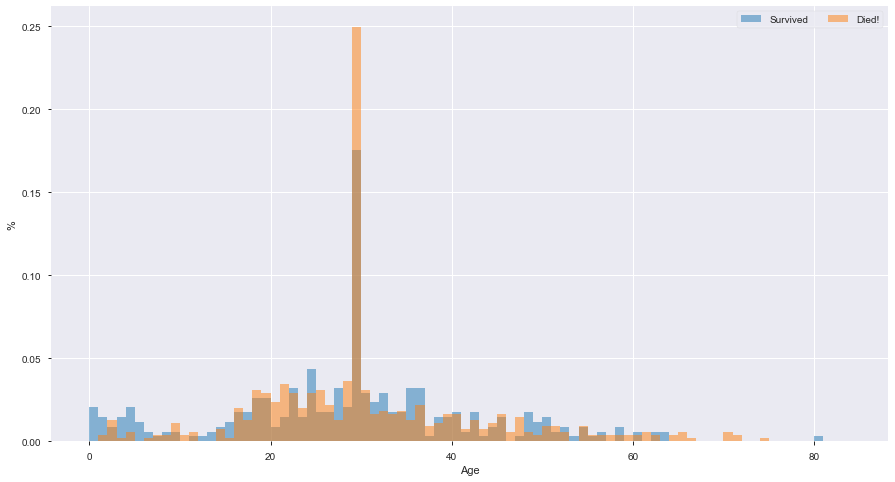

In [18]:
bins = np.linspace(0, 84, 85)

plt.figure(figsize=(15, 8))
plt.hist(df_tr[df_tr["Survived"] == 1]["Age"], bins, alpha=0.5, density=True, label='Survived');
plt.hist(df_tr[df_tr["Survived"] == 0]["Age"], bins, alpha=0.5, density=True, label='Died!');
plt.ylabel("%")
plt.xlabel("Age");
plt.legend(ncol=2, loc="upper right", frameon=True);

All the null values that we had on Age and that we have filled with the mean are shown now in the huge peak. 
We could have calculated the probabilistic distribution of age and apply random values following that distribution or other solutions like calculating the mean of age for group (depending on class, sex, etc)

In [19]:
df_tr.groupby(["male", "female", "Pclass"])[["Age"]].mean()

Age
male female Pclass           
0    1      1       34.141405
            2       28.748661
            3       24.068493
1    0      1       39.287717
            2       30.653908
            3       27.372153

In [20]:
df = df_train
# Graphs parameters
fig = plt.figure(figsize=(18,6), dpi=1600) 
alpha=alpha_scatterplot = 0.2 
alpha_bar_chart = 0.55

# Create Plot Grid
ax1 = plt.subplot2grid((2,3),(0,0))
# Plot: Who surived vs those who did not             
df.Survived.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
# this nicely sets the margins in matplotlib to deal with a recent bug 1.3.1
ax1.set_xlim(-1, 2)
# puts a title on our graph
plt.title("Distribution of Survival, (1 = Survived)")    

plt.subplot2grid((2,3),(0,1))
plt.scatter(df.Survived, df.Age, alpha=alpha_scatterplot)
# sets the y axis lable
plt.ylabel("Age")
# format the grid line style of our graphs                          
plt.grid(b=True, which='major', axis='y')  
plt.title("Survival by Age,  (1 = Survived)")

ax3 = plt.subplot2grid((2,3),(0,2))
df.Pclass.value_counts().plot(kind="barh", alpha=alpha_bar_chart)
ax3.set_ylim(-1, len(df.Pclass.value_counts()))
plt.title("Class Distribution")

plt.subplot2grid((2,3),(1,0), colspan=2)
# Plots a kernel density estimate of the subset of the 1st class passangers's age
df.Age[df.Pclass == 1].plot(kind='kde')    
df.Age[df.Pclass == 2].plot(kind='kde')
df.Age[df.Pclass == 3].plot(kind='kde')
 # plots an axis lable
plt.xlabel("Age")    
plt.title("Age Distribution within classes")
# sets our legend for our graph.
plt.legend(('1st Class', '2nd Class','3rd Class'),loc='best') 

ax5 = plt.subplot2grid((2,3),(1,2))
df.Embarked.value_counts().plot(kind='bar', alpha=alpha_bar_chart)
ax5.set_xlim(-1, len(df.Embarked.value_counts()))
# specifies the parameters of our graphs
plt.title("Passengers per boarding location");

### Plots by Gender

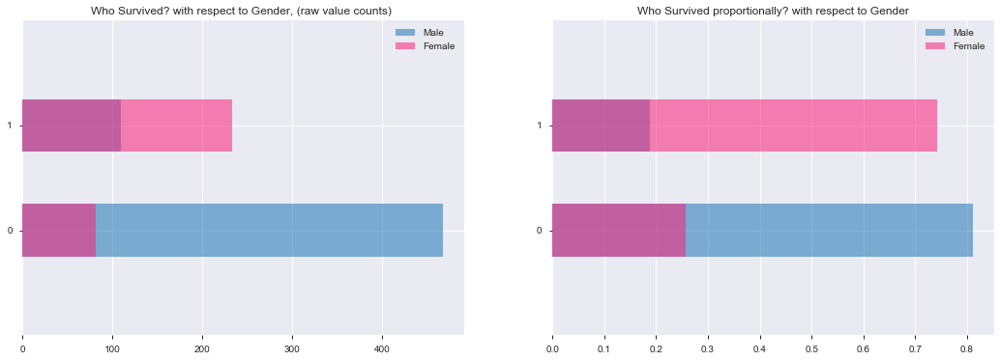

In [21]:
# Plot with 2 subsets (male and female) of the survived variable plotting the counts
fig = plt.figure(figsize=(18,6))

df_male = df.Survived[df.Sex == 'male'].value_counts().sort_index()
df_female = df.Survived[df.Sex == 'female'].value_counts().sort_index()

ax1 = fig.add_subplot(121)
df_male.plot(kind='barh',label='Male', alpha=0.55)          # barh is the horizontal bar graph
df_female.plot(kind='barh', color='#FA2379',label='Female', alpha=0.55)
plt.title("Who Survived? with respect to Gender, (raw value counts) "); plt.legend(loc='best');
ax1.set_ylim(-1, 2);

#adjust graph to display the proportions of survival by gender
ax2 = fig.add_subplot(122)
(df_male/float(df_male.sum())).plot(kind='barh',label='Male', alpha=0.55)  
(df_female/float(df_female.sum())).plot(kind='barh', color='#FA2379',label='Female', alpha=0.55)
plt.title("Who Survived proportionally? with respect to Gender"); plt.legend(loc='best');

ax2.set_ylim(-1, 2);

### Using Pclass

In [22]:
fig = plt.figure(figsize=(18,4), dpi=1600)
alpha_level = 0.65

# we created for the survived variable. I know, thats a lot of subsets. After we do that we call 
# value_counts() so it it can be easily plotted as a bar graph. this is repeated for each gender 
# class pair.
ax1=fig.add_subplot(141)
female_highclass = df_tr.Survived[df_tr.Sex == 'female'][df_tr.Pclass != 3].value_counts()
female_highclass.plot(kind='bar', label='female, highclass', color='#FA2479', alpha=alpha_level)
ax1.set_xticklabels(["Survived", "Died"], rotation=0)
ax1.set_xlim(-1, len(female_highclass))
plt.title("Who Survived? with respect to Gender and Class"); plt.legend(loc='best');

ax2=fig.add_subplot(142, sharey=ax1)
female_lowclass = df_tr.Survived[df_tr.Sex == 'female'][df_tr.Pclass == 3].value_counts()
female_lowclass.plot(kind='bar', label='female, low class', color='pink', alpha=alpha_level)
ax2.set_xticklabels(["Died","Survived"], rotation=0)
ax2.set_xlim(-1, len(female_lowclass))
plt.legend(loc='best');

ax3=fig.add_subplot(143, sharey=ax1)
male_lowclass = df_tr.Survived[df_tr.Sex == 'male'][df_tr.Pclass == 3].value_counts()
male_lowclass.plot(kind='bar', label='male, low class',color='lightblue', alpha=alpha_level)
ax3.set_xticklabels(["Died","Survived"], rotation=0)
ax3.set_xlim(-1, len(male_lowclass))
plt.legend(loc='best');

ax4=fig.add_subplot(144, sharey=ax1)
male_highclass = df_tr.Survived[df_tr.Sex == 'male'][df_tr.Pclass != 3].value_counts()
male_highclass.plot(kind='bar', label='male, highclass', alpha=alpha_level, color='steelblue')
ax4.set_xticklabels(["Died","Survived"], rotation=0)
ax4.set_xlim(-1, len(male_highclass))
plt.legend(loc='best');

In [23]:
df_train.profile_report()

### Other representations:

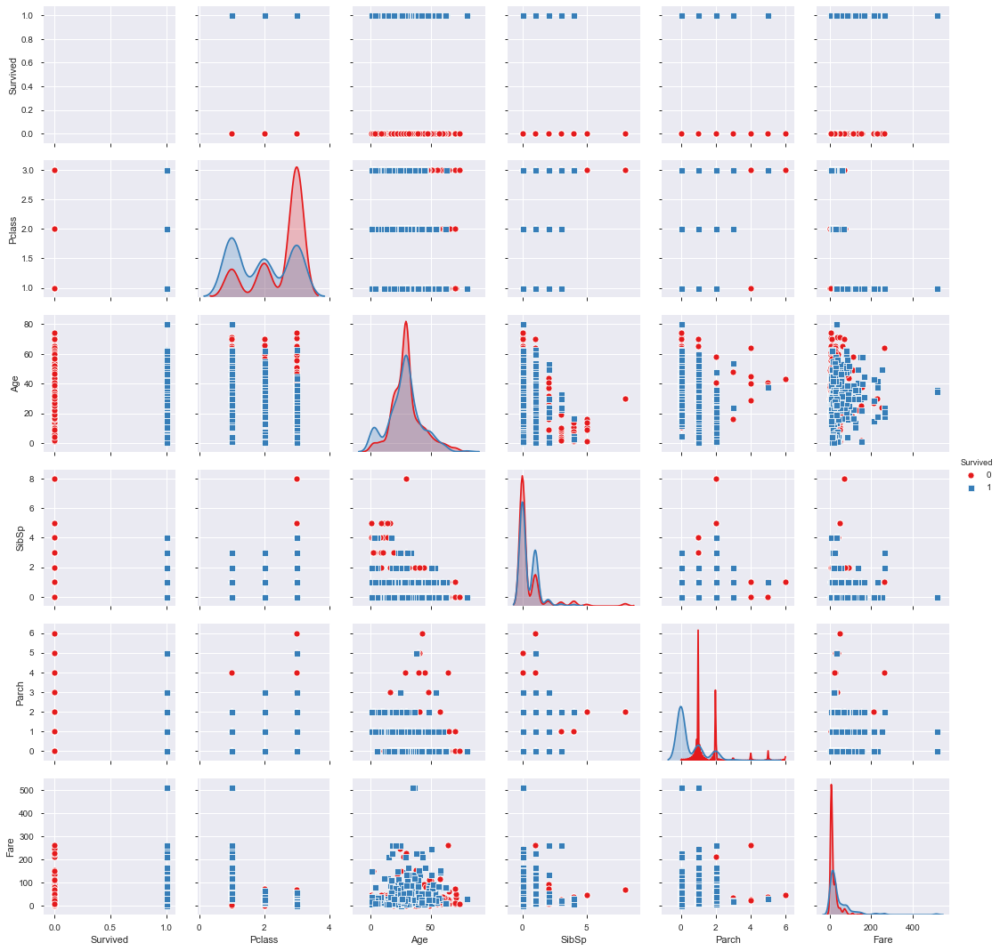

In [24]:
sns.pairplot(df, kind="scatter", hue="Survived", markers=["o", "s"], palette="Set1");

### Remarks:

Other things to do include:
- Evaluate and find possible outliers. Depending on the application it may be better to drop them.
- Validate the data with sanity checks (ex: are all 'age' values positive and within an acceptable range? do we have a port name that doesn't exist? etc...)

### 3) Choose a Model

We are performing a classification task so we'll apply a classification model:
- K-Nearest Neighbor 
- Naive Bayes 
- Support Vector Machines
- ...

Let's apply [K-Nearest Neighbor](https://en.wikipedia.org/wiki/K-nearest_neighbors_algorithm)

##### K-Nearest Neighbor

In [25]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import FeatureUnion, Pipeline, make_pipeline, make_union
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import cross_val_score, StratifiedKFold

# Create the classifier
clf_knn = KNeighborsClassifier(n_neighbors = 5)

# how we want to split up the data
str_k_fold = StratifiedKFold(n_splits=5, random_state=42)

selected_features = ["Pclass", "Age", "SibSp", "Parch", "Fare", "C", "Q", "S", "female", "male"]
X = df_tr[selected_features]
y = df_tr['Survived']

### 4) Evaluation

In [26]:
# cross_val_score to train 80% of data and test remaining 20%.
scores_knn = cross_val_score(clf_knn, X, y, cv=str_k_fold)
print(f"k-Nearest Neighbor Score results: {scores_knn}")

k-Nearest Neighbor Score results: [0.65921788 0.67597765 0.71348315 0.7247191  0.71751412]


### 5) Group all the transformations

This is basically to create a pipeline

In [27]:
def data_pipeline(df, age=MEAN_AGE, port=EMBARKED_PORT):
    """Apply all transformations and get X and y"""
    df['Age'] = df_train['Age'].fillna(age)
    df['Embarked'] = df['Embarked'].fillna(port)
    df_sex = pd.get_dummies(df['Sex'])
    df_emb = pd.get_dummies(df['Embarked'])
    df = pd.concat([df, df_emb, df_sex], axis = 1)
    X = df[selected_features]
    return X, y

# Or like part of a pipeline
class DataPipeline(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
        
    def fit(self, df):
        return self
        
    def transform(self, df):
        X, y = data_pipeline(df)
    
        return X

In [28]:
# Apply the pipeline to the test set
data_pipe = DataPipeline()
X_te = data_pipe.transform(df_test)
y_te = y_test["Survived"]

##### Random Forest

In [29]:
from sklearn.ensemble import RandomForestClassifier

clf_random_forest = RandomForestClassifier(n_estimators=50)
# create a kfold split
str_k_fold = StratifiedKFold(n_splits = 5, shuffle=True, random_state=42)
# cross_val_score to train 80% of data and test remaining 20%
score_random_forest = cross_val_score(clf_random_forest, X, y, cv=str_k_fold)
print(f"Random Forest Score results: {score_random_forest}")

Random Forest Score results: [0.77653631 0.82122905 0.76966292 0.88764045 0.8079096 ]


#### KNN with standardization

In [30]:
std_sc = StandardScaler()

# Join the the standadization and classification model in a pipeline
knn_pipeline = Pipeline([('transformer', std_sc), ('Standardized KNN', clf_knn)])
scores_knn_std = cross_val_score(knn_pipeline, X, y, cv=str_k_fold)
print(f"KNN with Standardization Score results: {scores_knn_std}")

KNN with Standardization Score results: [0.7877095  0.7877095  0.80898876 0.87078652 0.82485876]


### 6) Comparison

In [31]:
models = [
    clf_knn,
    clf_random_forest,
    knn_pipeline,
]

def cross_validate_models(models, metric="accuracy"):
    entries = []
    for model in models:
        # Extract the model name from the pipeline classifier
        model_name = [(model.steps[1][0] if hasattr(model, 'steps') else model.__class__.__name__ )][0]
        accuracies = cross_val_score(model, X, y, scoring=metric, cv=str_k_fold)

        for idx, accuracy in enumerate(accuracies):
            entries.append((model_name, idx, accuracy))

    cv_df = pd.DataFrame(entries, columns=['model_name', 'fold_index', metric])
    return cv_df

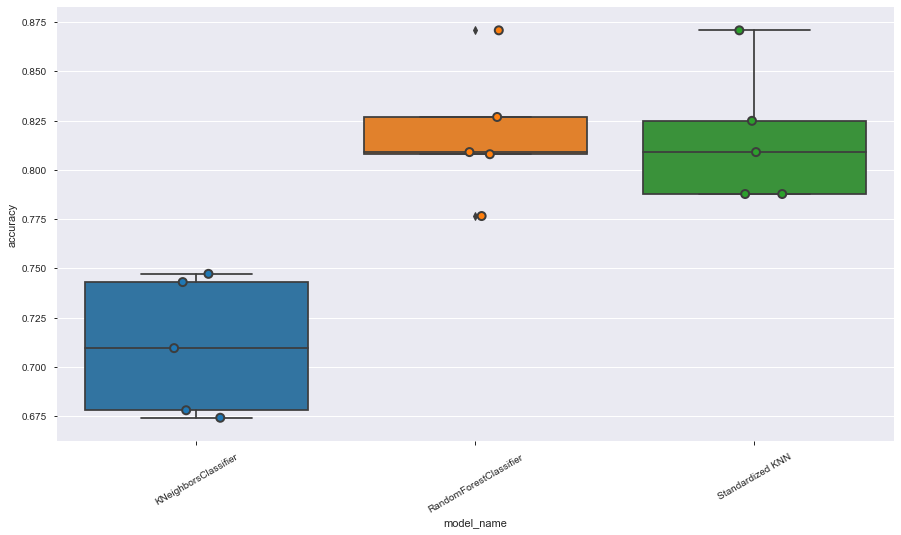

In [32]:
cv_df = cross_validate_models(models)
metric = "accuracy"

plt.figure(figsize=(15, 8))
g = sns.boxplot(x='model_name', y=metric, data=cv_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)
sns.stripplot(x='model_name', y=metric, data=cv_df, size=8, jitter=True, edgecolor="gray", linewidth=2)
plt.show()

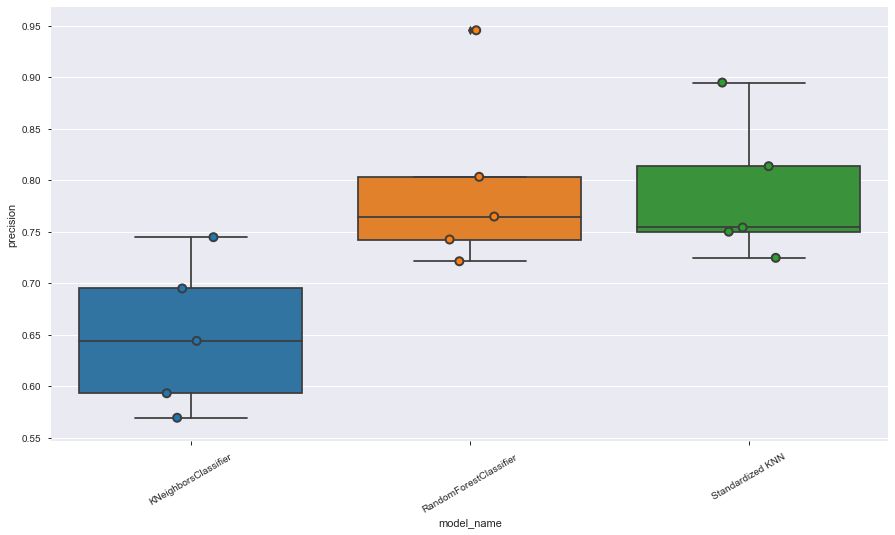

In [33]:
metric = "precision"
cv_df = cross_validate_models(models, metric=metric)

plt.figure(figsize=(15, 8))
g = sns.boxplot(x='model_name', y=metric, data=cv_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)
sns.stripplot(x='model_name', y=metric, data=cv_df, size=8, jitter=True, edgecolor="gray", linewidth=2)
plt.show()

### Other Models

In [34]:
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import svm

clf_naive_bayes = GaussianNB()
clf_log_regression = LogisticRegression(solver='lbfgs', multi_class='ovr', max_iter=500, random_state=42)
clf_extra_trees = ExtraTreesClassifier(n_estimators=50)
clf_svm = svm.LinearSVC(max_iter=5000)
clf_decision = DecisionTreeClassifier()

svm_pipeline = Pipeline([('transformer', std_sc), ('SVM Std', clf_svm)])

models = [
    clf_knn,
    knn_pipeline,
    clf_naive_bayes,
    clf_log_regression,
    svm_pipeline,
    clf_random_forest,
    clf_extra_trees,
    clf_decision,
]

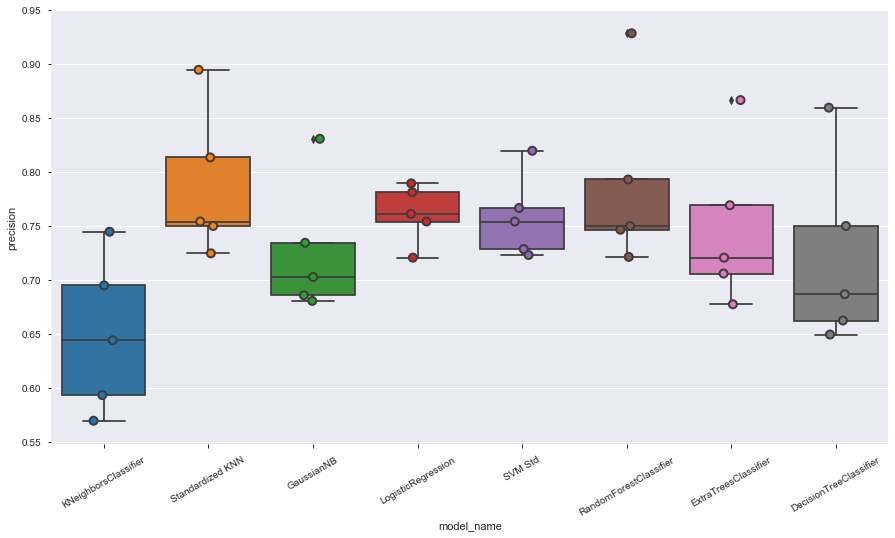

In [35]:
metric = "precision"
cv_df = cross_validate_models(models, metric=metric)

plt.figure(figsize=(15, 8))
g = sns.boxplot(x='model_name', y=metric, data=cv_df)
g.set_xticklabels(g.get_xticklabels(), rotation=30)
sns.stripplot(x='model_name', y=metric, data=cv_df, size=8, jitter=True, edgecolor="gray", linewidth=2)
plt.show()


#### Models Classification

<img src="./models_classification.png" alt="Models Classification" width="800"/>

#### Train and evaluate best model vs the test set 

Using in this case one of the best models so far, let's train in on the test set and evaluate the performance against the labels of the test set.

In [36]:
model = knn_pipeline.fit(X, y)

In [37]:
model.predict(X_te)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

We obtain an error and it is due to the missing values in the test set.

Previously in our train set we didn't have any missing values in **Fare** so we didn't perform any cleaning or filling of missing values. That can happen in this evaluation but in a production system we will require some validation of all possible features precicely to avoid this scenario. Basically all features must have validations to avoid problems in the data pipeline.....

In [38]:
FARE = df_train["Fare"].mean()

def data_pipeline(df, age=MEAN_AGE, port=EMBARKED_PORT, fare=FARE):
    """Apply all transformations and get X and y"""
    df['Age'] = df_train['Age'].fillna(age)
    df['Embarked'] = df['Embarked'].fillna(port)
    df['Fare'] = df['Fare'].fillna(fare)
    df_sex = pd.get_dummies(df['Sex'])
    df_emb = pd.get_dummies(df['Embarked'])
    df = pd.concat([df, df_emb, df_sex], axis = 1)
    X = df[selected_features]
    return X, y

# Or like part of a pipeline
class DataPipeline(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
        
    def fit(self, df):
        return self
        
    def transform(self, df):
        X, y = data_pipeline(df)
    
        return X

In [40]:
X_te = data_pipe.transform(df_test)
model.predict(X_te)

array([0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,

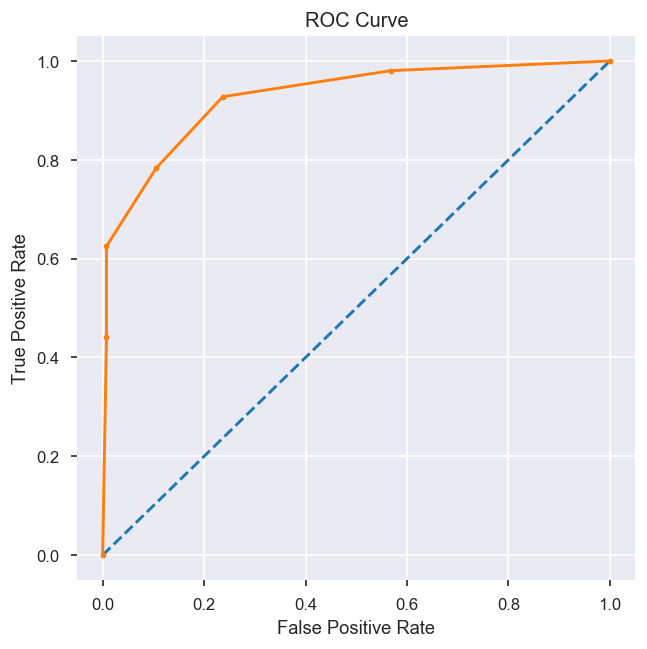

In [42]:
from sklearn.metrics import roc_curve

prob_true = [t[1] for t in model.predict_proba(X_te)]
fpr, tpr, thresholds = roc_curve(y_te, prob_true)

fig = plt.figure(figsize=(6, 6), dpi=120)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.');
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate");

Now we have the predictions and we can use the previous metrics to evaluate the results of the model.

In [43]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

y_predicted = model.predict(X_te)
print(f"Accuracy Score [Test dataset]: \t{accuracy_score(y_te, y_predicted):.3f}")
print(f"Precision Score [Test dataset]: {precision_score(y_te, y_predicted):.3f}")
print(f"Recall Score [Test dataset]: \t{recall_score(y_te, y_predicted):.3f}")
print(f"F1 Score [Test dataset]: \t{f1_score(y_te, y_predicted):.3f}")
confusion_matrix(y_te, y_predicted)

Accuracy Score [Test dataset]: 	0.854
Precision Score [Test dataset]: 0.810
Recall Score [Test dataset]: 	0.783
F1 Score [Test dataset]: 	0.796


array([[238,  28],
       [ 33, 119]])

Those are the results of the different metrics for the model on the dataset that the model has not seen before!

Clarifying the output of the confusion matrix, it tell us: (tn, fp, fn, tp) <br>
And it tells us the relation between the **Real Labels** and the **Predicted Labels**
- tn: True negatives
- fp: False positives
- fn: False negatives
- tp: True positives

| ########  | Pred False | Pred True |
|-----------|--------|--------|
| Real False|  tn    |  fp    |
| Real True |  fn    |  tp    |

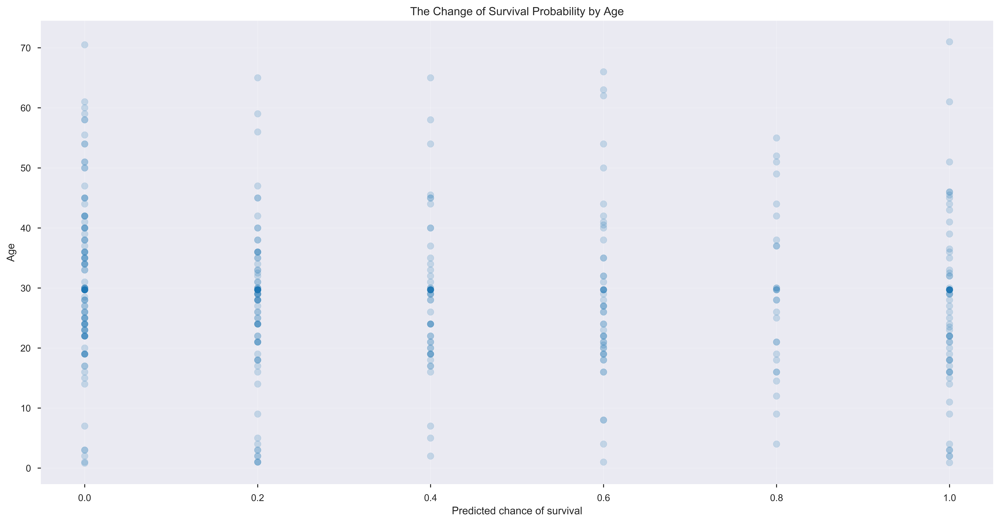

In [44]:
from statsmodels.nonparametric.kde import KDEUnivariate

fig = plt.figure(figsize=(18,9), dpi=500)
a = .2

# The model is generating the probability of each possible outcome
# If we predict the probability of the True outcome which is at index '1'...
prob_true = [t[1] for t in model.predict_proba(X_te)]
plt.scatter(prob_true, X_te.Age , alpha=a)
plt.grid(True, linewidth=0.15)
plt.title("The Change of Survival Probability by Age")
plt.xlabel("Predicted chance of survival")
plt.ylabel("Age");

The previous graph is not very informative, but if we apply the same logic to the logistic regression model...

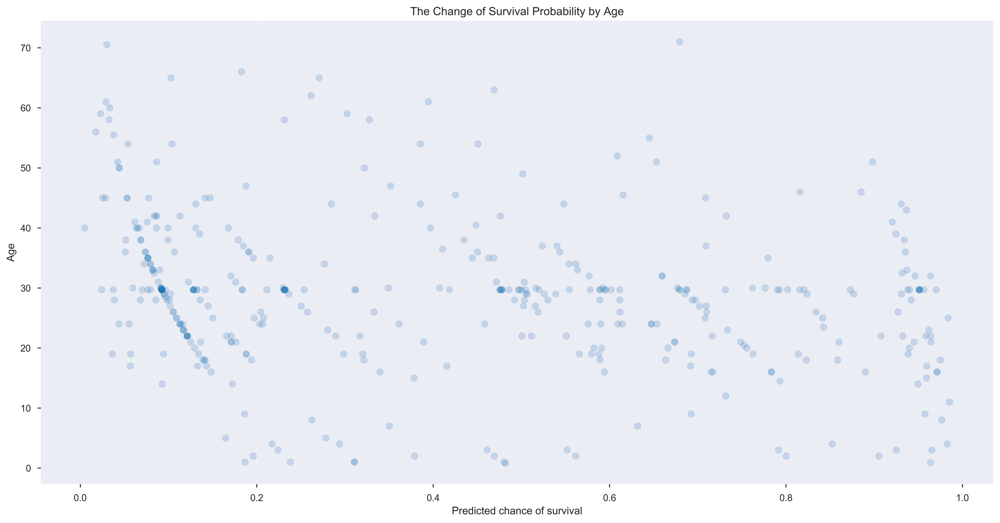

In [45]:
log_reg = clf_log_regression.fit(X, y)

fig = plt.figure(figsize=(18,9), dpi=500)
a = .2

# The model is generating the probability of each possible outcome
# If we predict the probability of the True outcome which is at index '1'...
prob_true = [t[1] for t in log_reg.predict_proba(X_te)]
plt.scatter(prob_true, X_te.Age , alpha=a)
plt.grid(True, linewidth=0.15)
plt.title("The Change of Survival Probability by Age")
plt.xlabel("Predicted chance of survival")
plt.ylabel("Age");

And if we want to observe the distribution of our predictions:

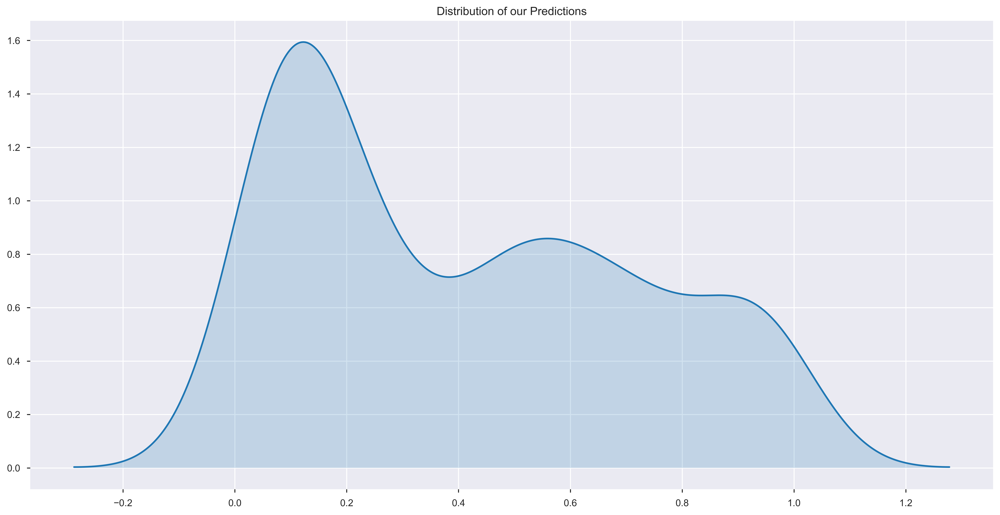

In [46]:
fig = plt.figure(figsize=(18,9), dpi=500)

kde_res = KDEUnivariate(prob_true)
kde_res.fit()
plt.plot(kde_res.support, kde_res.density)
plt.fill_between(kde_res.support,kde_res.density, alpha=a)
plt.title("Distribution of our Predictions");

## ROC Curve

We use the **Receiver Operating Characteristic** (ROC) when predicting the probability of a binary outcome as it can help us to understand the behaviour of the model depending on the threshold in which we classify the outcome as True or Positive.

The more straigh forward outcome is for anything with a probability >= 50% to be classified as Positive.

Moving back to the ROC, it is a plot of the false positive rate (x-axis) versus the true positive rate (y-axis) for a number of different threshold values between 0.0 and 1.0. From a different perspective, it plots the false alarm rate versus the hit rate.

The true positive rate is calculated as the number of true positives divided by the sum of the number of true positives and the number of false negatives. It describes **how good the model is at predicting the positive class when the actual outcome is positive**.

The false positive rate is calculated as the number of false positives divided by the sum of the number of false positives and the number of true negatives.
It is also called the false alarm rate as it summarizes how often a positive class is predicted when the actual outcome is negative.

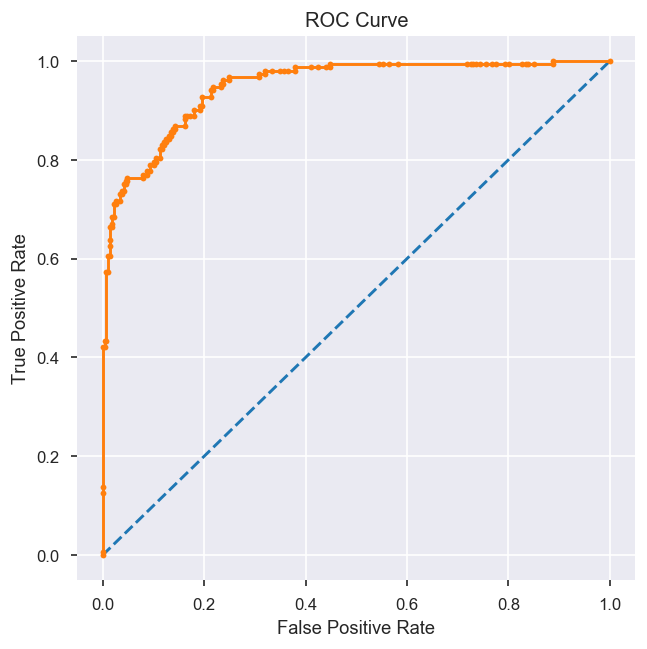

In [47]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_te, prob_true)
fig = plt.figure(figsize=(6, 6), dpi=120)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.');
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate");

Observing this graph, we could decide that the model will behave much better in the point where we have 0.97 of True Positive Rate and only 0.25 of False Positive Rate and inclreasing the True Positive Rate to 0.99 is not worth it because of the increase on the False Positive Rate to 0.5

That's very logical and we can do it, but not based on this graph as it will be **wrong**. Because this is the data of the test set and the predictions of the test set, we will be just **overfitting** to the test set. To do the selection of in which point we want the model to work, we must do it **during the cross-validation** when we are using the training set.

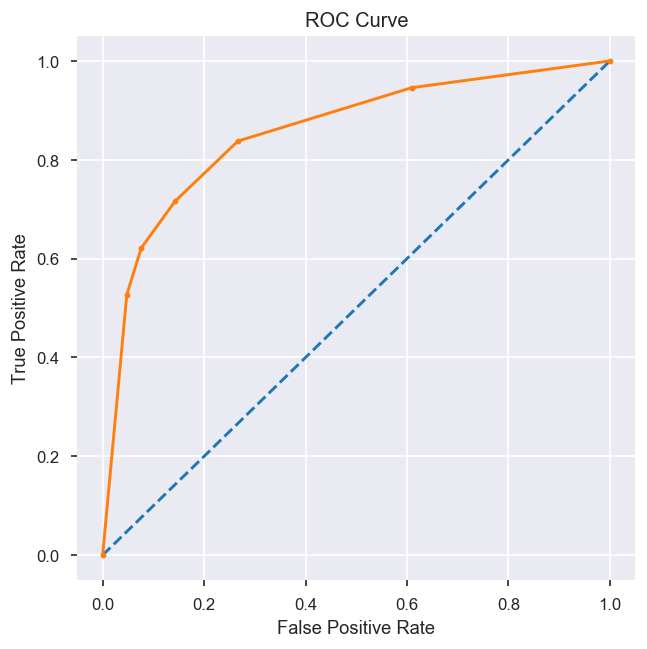

In [48]:
x_tr_1, x_te_1, y_tr_1, y_te_1 = train_test_split(X, y, test_size=0.2, random_state=42)
model = knn_pipeline.fit(x_tr_1, y_tr_1)

y_te_prob_true = [t[1] for t in model.predict_proba(x_te_1)]
fpr, tpr, thresholds = roc_curve(y_te_1, y_te_prob_true)
fig = plt.figure(figsize=(6, 6), dpi=120)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.');
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate");

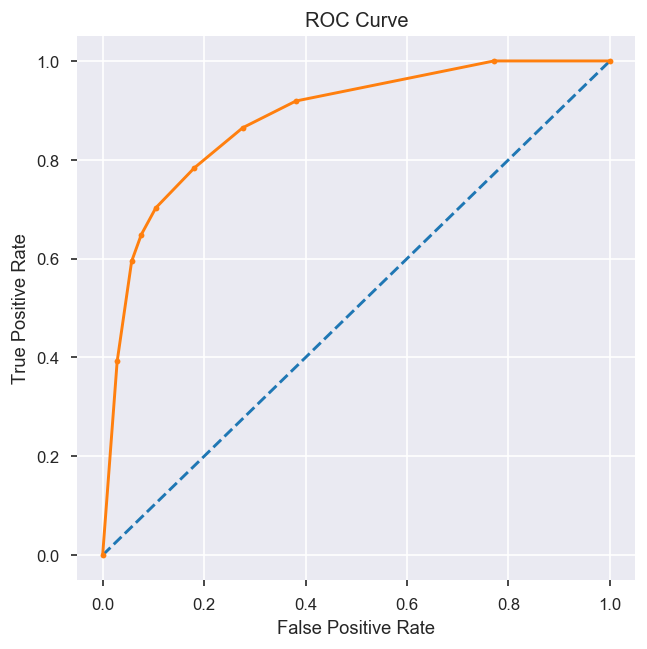

In [49]:
# Or we can decide to modify the model to gain a little more area in the ROC and improve slightly the model
clf_knn = KNeighborsClassifier(n_neighbors=8)
knn_pipeline = Pipeline([('transformer', std_sc), ('Standardized KNN', clf_knn)])
model = knn_pipeline.fit(x_tr_1, y_tr_1)

y_te_prob_true = [t[1] for t in model.predict_proba(x_te_1)]
fpr, tpr, thresholds = roc_curve(y_te_1, y_te_prob_true)
fig = plt.figure(figsize=(6, 6), dpi=120)
plt.plot([0, 1], [0, 1], linestyle='--')

# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.');
plt.title("ROC Curve")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate");

As a side note on decision trees, we can plot the structure to understand the underlying logic that the model has extracted from the data....

In [50]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

model = clf_decision.fit(X, y)

dot_data = StringIO()
export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X.columns, class_names=['0','1'])

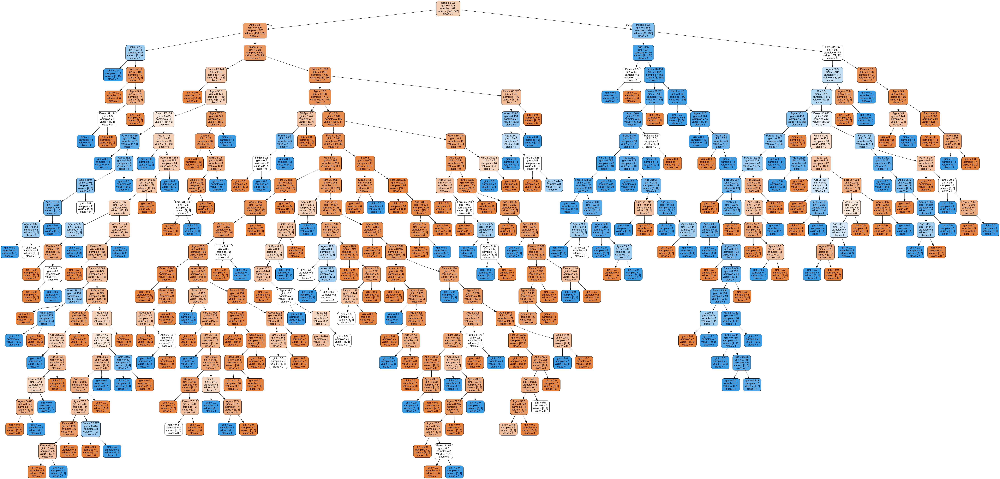

In [59]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Titanic_decision_tree.png')
Image(graph.create_png())

### And now.....

Now is the time to go back to the features the had at the beginning, so we can:
- Improve the existing features
- Create new features
- Re-train the models with the improved features trying to beat the metrics obtained in the previous models

And that's the typical Machine Learning process that never ends until we decide that a model is **good enough** and we move to a new task.

Congratulations! You did it! ;)